In [1]:
pip install rasterio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 44.7 MB/s eta 0:00:00:00:0100:01
Note: you may need to restart the kernel to use updated packages.


In [2]:
import pickle,os,rasterio,cv2
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from tqdm import tqdm

In [3]:
dpath = '/kaggle/input/wildfirespreadts/WildfireSpreadTS'
os.listdir(dpath)

['2020', '2019', '2021', '2018']

In [4]:
df = pd.DataFrame(columns=['Year','Fire_Event_ID','Duration (days)'])
for yr in os.listdir(dpath):
    yrpath = os.path.join(dpath,yr)
    for evid in os.listdir(yrpath):
        dur = len(os.listdir(os.path.join(yrpath,evid)))
        df.loc[len(df)] = [int(yr), evid, dur]
df.head()

,Year,Fire_Event_ID,Duration (days)
0,2020,fire_24332647,60
1,2020,fire_24333277,15
2,2020,fire_24604435,26
3,2020,fire_24025599,11
4,2020,fire_24333267,9


In [5]:
df.sort_values(by='Duration (days)',ascending=False,ignore_index=True,inplace=True)
df

,Year,Fire_Event_ID,Duration (days)
0,2018,fire_21889697,94
1,2020,fire_24332628,76
2,2021,fire_25294714,72
3,2018,fire_21889719,67
4,2021,fire_25294691,63
...,...,...,...
602,2019,fire_23036542,11
603,2018,fire_21997854,10
604,2021,fire_25294989,10
605,2020,fire_24461965,10


In [6]:
for yr in range(2018,2022):
    num_fire_events = sum(df['Year']==yr)
    max_files = max(df[df['Year']==yr]['Duration (days)'])
    min_files = min(df[df['Year']==yr]['Duration (days)'])
    avg_files = df[df['Year']==yr]['Duration (days)'].mean()
    total_files = df[df['Year']==yr]['Duration (days)'].sum()
    print(f"Year: {yr}")
    print(f"  Number of fire events: {num_fire_events}")
    print(f"  Max files in a fire event: {max_files}")
    print(f"  Min files in a fire event: {min_files}")
    print(f"  Avg files per fire event: {avg_files:.4f}")
    print(f"  Total files : {total_files}")
    print("-" * 40)

Year: 2018
  Number of fire events: 176
  Max files in a fire event: 94
  Min files in a fire event: 10
  Avg files per fire event: 21.4375
  Total files : 3773
----------------------------------------
Year: 2019
  Number of fire events: 74
  Max files in a fire event: 34
  Min files in a fire event: 11
  Avg files per fire event: 19.2568
  Total files : 1425
----------------------------------------
Year: 2020
  Number of fire events: 201
  Max files in a fire event: 76
  Min files in a fire event: 9
  Avg files per fire event: 21.3532
  Total files : 4292
----------------------------------------
Year: 2021
  Number of fire events: 156
  Max files in a fire event: 72
  Min files in a fire event: 10
  Avg files per fire event: 26.3910
  Total files : 4117
----------------------------------------


Number of bands: 23
Image dimensions (width x height): 292 x 338


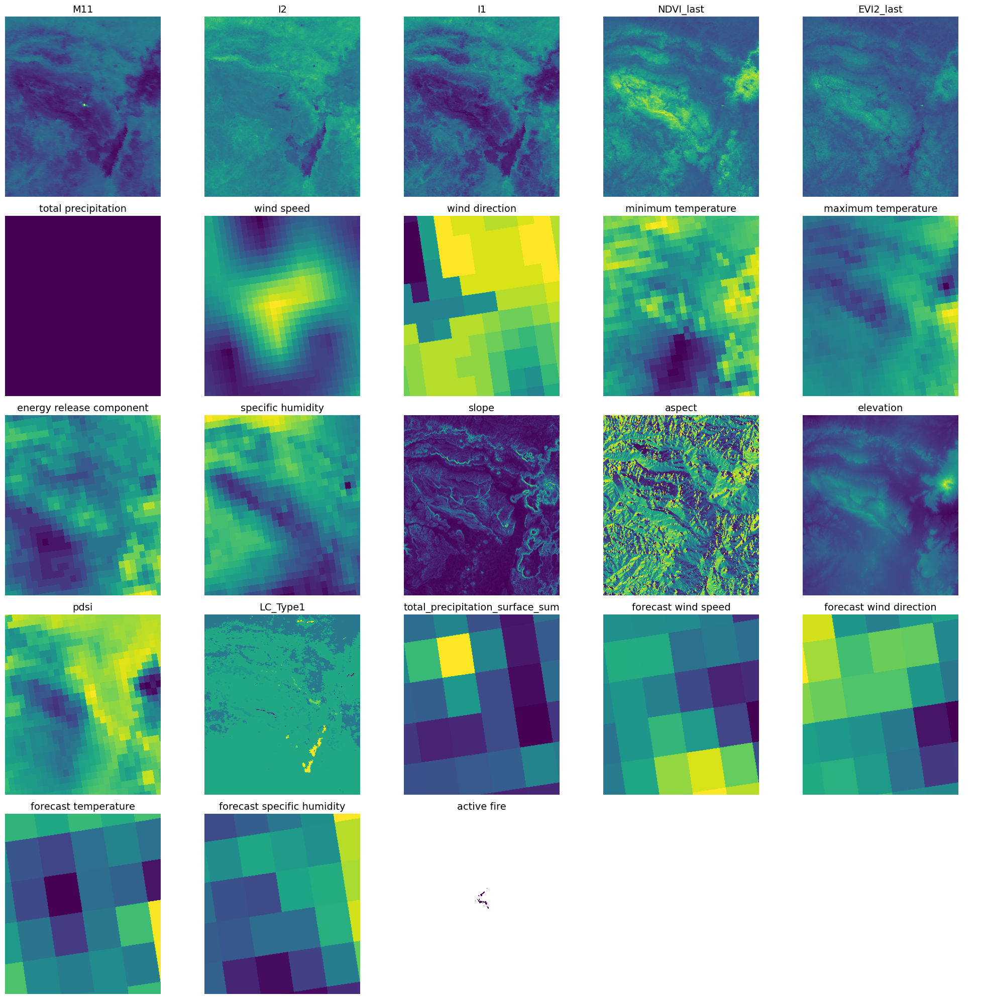

In [7]:
spath = os.path.join(dpath,'2018/fire_21690102/2018-04-17.tif')
with rasterio.open(spath) as tif:
    print("Number of bands:", tif.count)
    print("Image dimensions (width x height):", tif.width, "x", tif.height)
    all_bands = tif.read()
    band_names = tif.descriptions

rows, cols = 5, 5
fig, axes = plt.subplots(rows, cols, figsize=(20, 20))
axes = axes.flatten()
num_bands = all_bands.shape[0]
for i in range(rows * cols):
    ax = axes[i]
    if i < num_bands:
        im = ax.imshow(all_bands[i])
        ax.set_title(band_names[i],fontsize=14)
        ax.axis('off')
    else:
        ax.axis('off')
plt.tight_layout()
plt.show()

/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


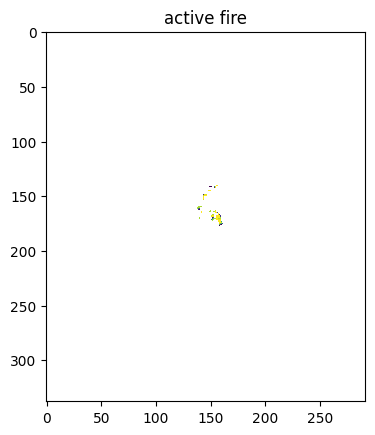

In [8]:
def get_band(path,pos):
    with rasterio.open(path) as tif:
        all_bands = tif.read()
    return all_bands[pos]
spath2 = os.path.join(dpath,'2018/fire_21690102/2018-04-16.tif')
pos = -1
band = get_band(spath2,pos)
plt.imshow(band)
plt.title(band_names[pos])
ax.axis('off')
plt.show()

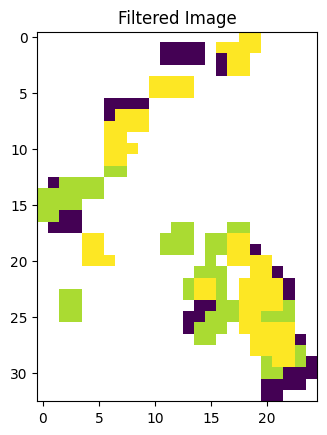

In [9]:
non_nan_rows = ~np.all(np.isnan(band), axis=1)
non_nan_cols = ~np.all(np.isnan(band), axis=0)
filtered_img = band[np.ix_(non_nan_rows, non_nan_cols)]
plt.imshow(filtered_img)
plt.title("Filtered Image")
plt.show()

In [10]:
np.nanmax(filtered_img),np.nanmin(filtered_img)

(2048.0, 930.0)

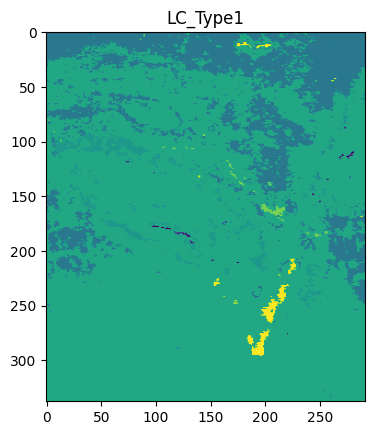

Max value = 16.0
Min value = 1.0


In [11]:
band = get_band(spath2,16)
plt.imshow(band)
plt.title(band_names[16])
ax.axis('off')
plt.show()
print('Max value =',np.nanmax(band))
print('Min value =',np.nanmin(band))

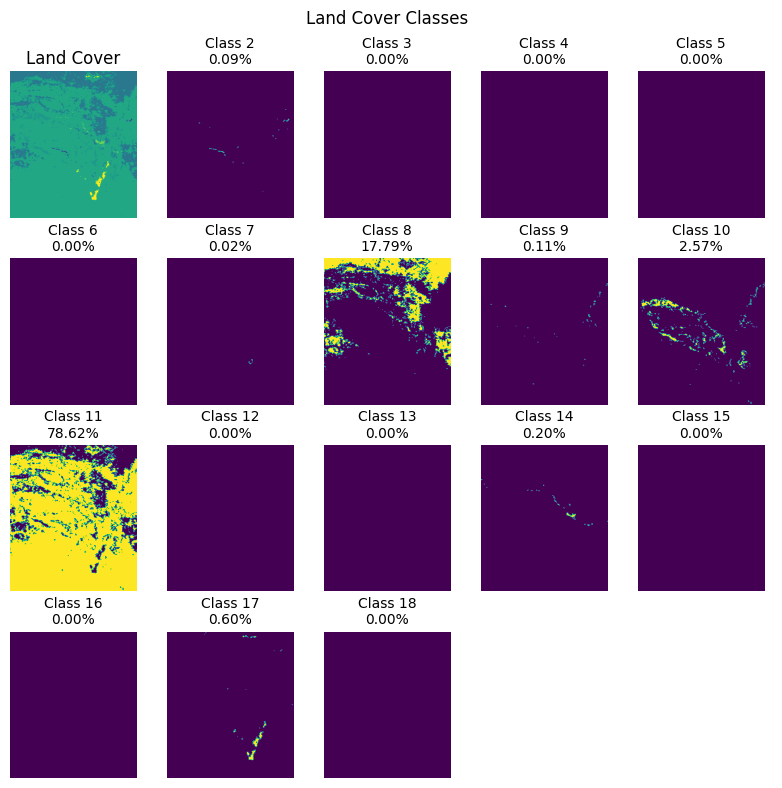

In [12]:
one_hot = np.array([band == i for i in range(1, 18)], dtype=np.uint8)
fig, axes = plt.subplots(4, 5, figsize=(8, 8))
axes = axes.flatten()
for i in range(18):
    ax = axes[i]
    if i==0:
        ax.imshow(band)
        ax.set_title('Land Cover')
    else:
        ax.imshow(one_hot[i-1])
        per = (one_hot[i-1]==1).sum()/one_hot[i-1].size
        ax.set_title(f'Class {i+1}\n{per*100:.2f}%',fontsize=10)
    ax.axis('off')
for j in range(18, 20):
    axes[j].axis('off')
plt.suptitle('Land Cover Classes',fontsize=12)
plt.tight_layout()
plt.show()

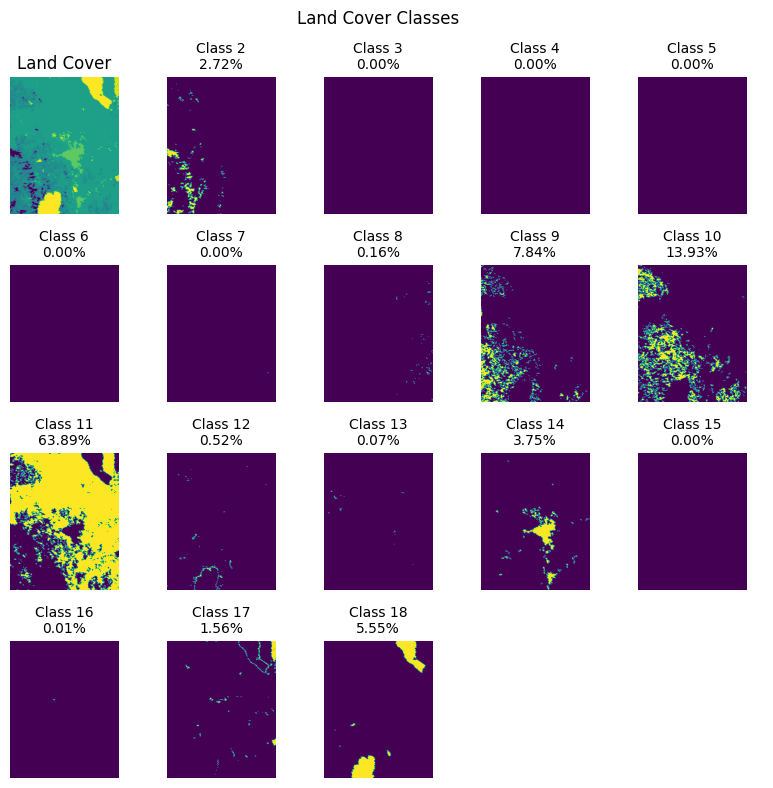

In [15]:
row = df.sample(n=1, random_state=None)
fepath = f"{dpath}/{row['Year'].values[0]}/{row['Fire_Event_ID'].values[0]}"
tif = np.random.choice(os.listdir(fepath))
spath3 = os.path.join(fepath,tif)
band = get_band(spath3,16)
one_hot = np.array([band == i for i in range(1, 18)], dtype=np.uint8)
fig, axes = plt.subplots(4, 5, figsize=(8, 8))
axes = axes.flatten()
for i in range(18):
    ax = axes[i]
    if i==0:
        ax.imshow(band)
        ax.set_title('Land Cover')
    else:
        ax.imshow(one_hot[i-1])
        per = (one_hot[i-1]==1).sum()/one_hot[i-1].size
        ax.set_title(f'Class {i+1}\n{per*100:.2f}%',fontsize=10)
    ax.axis('off')
for j in range(18, 20):
    axes[j].axis('off')
plt.suptitle('Land Cover Classes',fontsize=12)
plt.tight_layout()
plt.show()

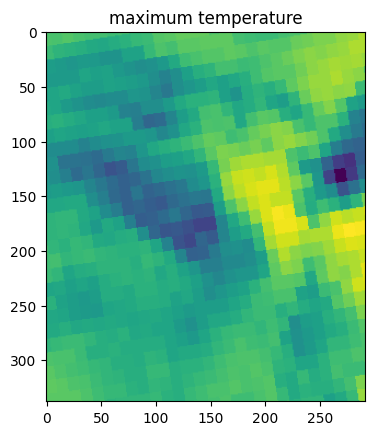

Max value = 298.4
Min value = 288.7


In [17]:
band = get_band(spath2,9)
plt.imshow(band)
plt.title(band_names[9])
ax.axis('off')
plt.show()
print('Max value =',np.nanmax(band))
print('Min value =',np.nanmin(band))

In [115]:
spdict = dict()
for i,row in tqdm(df.iterrows(),total=len(df)):
    path = f"{dpath}/{row['Year']}/{row['Fire_Event_ID']}"
    for tif in os.listdir(path):
        tpath = f"{dpath}/{row['Year']}/{row['Fire_Event_ID']}/{tif}"
        with rasterio.open(tpath) as tif:
            spdict[tpath] = (tif.width,tif.height)

100%|██████████| 607/607 [01:51<00:00,  5.44it/s]


In [122]:
spdf = pd.DataFrame.from_dict(spdict,orient='index', columns=['Width', 'Height']).reset_index()
spdf = spdf.rename(columns={'index': 'Path'})
spdf['Pixels'] = spdf['Width']*spdf['Height']
spdf

,Path,Width,Height,Pixels
0,/kaggle/input/wildfirespreadts/WildfireSpreadT...,223,300,66900
1,/kaggle/input/wildfirespreadts/WildfireSpreadT...,223,300,66900
2,/kaggle/input/wildfirespreadts/WildfireSpreadT...,223,300,66900
3,/kaggle/input/wildfirespreadts/WildfireSpreadT...,223,300,66900
4,/kaggle/input/wildfirespreadts/WildfireSpreadT...,223,300,66900
...,...,...,...,...
13602,/kaggle/input/wildfirespreadts/WildfireSpreadT...,266,339,90174
13603,/kaggle/input/wildfirespreadts/WildfireSpreadT...,266,339,90174
13604,/kaggle/input/wildfirespreadts/WildfireSpreadT...,266,339,90174
13605,/kaggle/input/wildfirespreadts/WildfireSpreadT...,266,339,90174


In [123]:
spdf.to_csv('/kaggle/working/TifShape.csv')

In [15]:
spdf = pd.read_csv('/kaggle/input/wildfirespreadts/TifShape.csv',index_col=0)
spdf

,Path,Width,Height,Pixels
0,/kaggle/input/wildfirespreadts/WildfireSpreadT...,223,300,66900
1,/kaggle/input/wildfirespreadts/WildfireSpreadT...,223,300,66900
2,/kaggle/input/wildfirespreadts/WildfireSpreadT...,223,300,66900
3,/kaggle/input/wildfirespreadts/WildfireSpreadT...,223,300,66900
4,/kaggle/input/wildfirespreadts/WildfireSpreadT...,223,300,66900
...,...,...,...,...
13602,/kaggle/input/wildfirespreadts/WildfireSpreadT...,266,339,90174
13603,/kaggle/input/wildfirespreadts/WildfireSpreadT...,266,339,90174
13604,/kaggle/input/wildfirespreadts/WildfireSpreadT...,266,339,90174
13605,/kaggle/input/wildfirespreadts/WildfireSpreadT...,266,339,90174


In [17]:
max(spdf['Width']),max(spdf['Height'])

(311, 356)

In [210]:
spdf[spdf['Pixels']==min(spdf['Pixels'])].head()

,Path,Width,Height,Pixels,Ratio
3440,/kaggle/input/wildfirespreadts/WildfireSpreadT...,207,304,62928,0.680921
3441,/kaggle/input/wildfirespreadts/WildfireSpreadT...,207,304,62928,0.680921
3442,/kaggle/input/wildfirespreadts/WildfireSpreadT...,207,304,62928,0.680921
3443,/kaggle/input/wildfirespreadts/WildfireSpreadT...,207,304,62928,0.680921
3444,/kaggle/input/wildfirespreadts/WildfireSpreadT...,207,304,62928,0.680921


In [211]:
spdf[spdf['Pixels']==max(spdf['Pixels'])].head()

,Path,Width,Height,Pixels,Ratio
11526,/kaggle/input/wildfirespreadts/WildfireSpreadT...,308,356,109648,0.865169
11527,/kaggle/input/wildfirespreadts/WildfireSpreadT...,308,356,109648,0.865169
11528,/kaggle/input/wildfirespreadts/WildfireSpreadT...,308,356,109648,0.865169
11529,/kaggle/input/wildfirespreadts/WildfireSpreadT...,308,356,109648,0.865169
11530,/kaggle/input/wildfirespreadts/WildfireSpreadT...,308,356,109648,0.865169


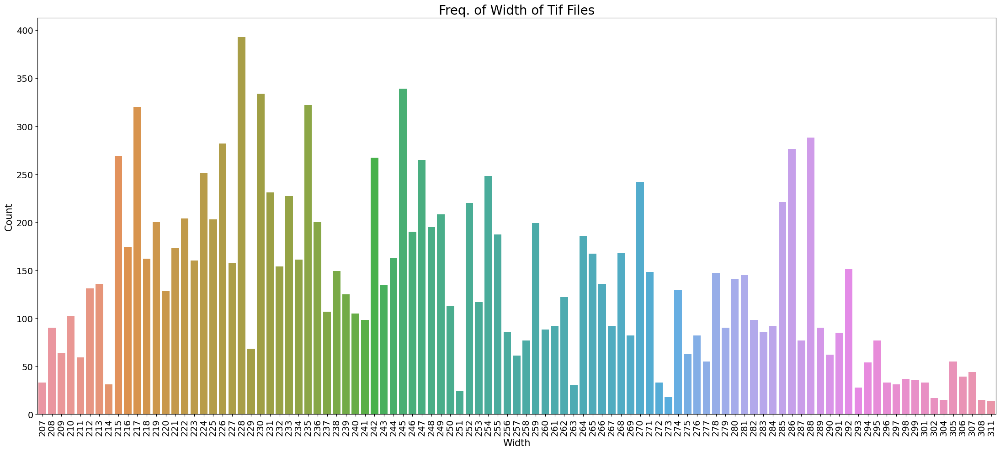

In [19]:
plt.figure(figsize=(22, 10)) 
sns.countplot(data=spdf, x='Width', order=sorted(spdf['Width'].unique()))
plt.xticks(rotation=90,fontsize=14)
plt.yticks(fontsize=14)
plt.title('Freq. of Width of Tif Files',fontsize=20)
plt.xlabel('Width',fontsize=15)
plt.ylabel('Count',fontsize=15)
plt.tight_layout()
plt.show()

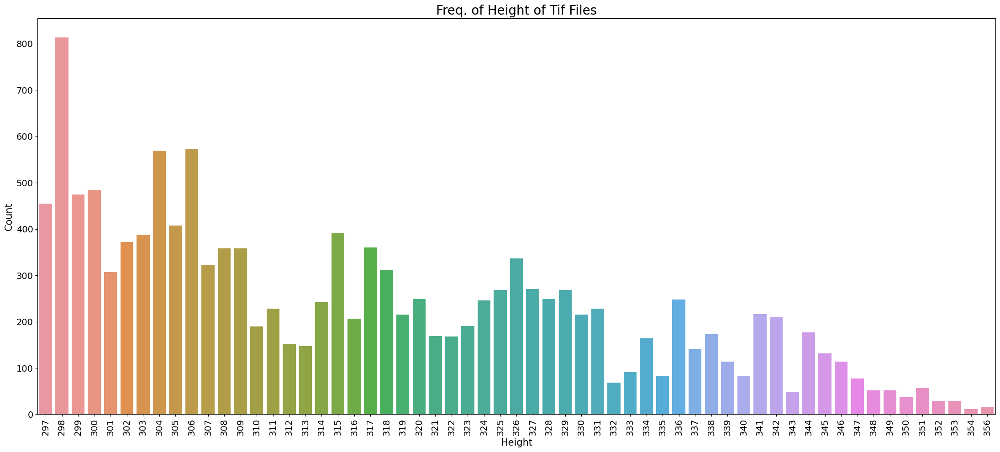

In [20]:
plt.figure(figsize=(22, 10)) 
sns.countplot(data=spdf, x='Height', order=sorted(spdf['Height'].unique()))
plt.xticks(rotation=90,fontsize=14)
plt.yticks(fontsize=14)
plt.title('Freq. of Height of Tif Files',fontsize=20)
plt.xlabel('Height',fontsize=15)
plt.ylabel('Count',fontsize=15)
plt.tight_layout()
plt.show()

In [21]:
spdf['Ratio'] = spdf['Width']/spdf['Height']

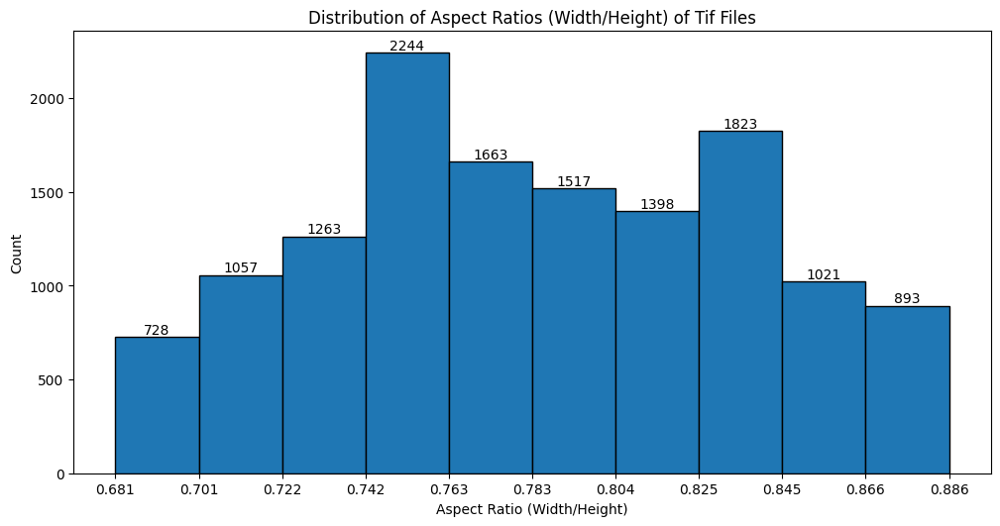

In [212]:
plt.figure(figsize=(10, 5)) 
counts, bins, patches = plt.hist(spdf['Ratio'], bins=10, edgecolor='black')
for i in range(len(patches)):
    height = counts[i]
    if height > 0:
        plt.text(patches[i].get_x() + patches[i].get_width()/2, height,
                 str(int(height)), ha='center', va='bottom', fontsize=10)
bin_labels = [f'{bins[i]:.3f}' for i in range(len(bins))]
plt.xticks(bins, bin_labels)
plt.tight_layout()
plt.title('Distribution of Aspect Ratios (Width/Height) of Tif Files')
plt.xlabel('Aspect Ratio (Width/Height)')
plt.ylabel('Count')
plt.show()

In [18]:
def getPercentFire(path):
    with rasterio.open(path) as tif:
        fband = tif.read(tif.count)
    pc = np.mean(~np.isnan(fband))*100
    return pc
getPercentFire(spath2)

0.19048391018886277

In [87]:
pcdict = dict()
for i,row in tqdm(df.iterrows(),total=len(df)):
    path = f"/kaggle/input/wildfirespreadts/{row['Year']}/{row['Fire_Event_ID']}"
    for tif in os.listdir(path):
        tpath = f"/kaggle/input/wildfirespreadts/{row['Year']}/{row['Fire_Event_ID']}/{tif}"
        pc = getPercentFire(tpath)
        pcdict[tpath] = pc

100%|██████████| 607/607 [27:55<00:00,  2.76s/it] 


In [89]:
with open('/kaggle/working/PercentFireDict.pkl','wb') as f:
    pickle.dump(pcdict,f)

In [19]:
with open('/kaggle/input/wildfirespreadts/PercentFireDict.pkl','rb') as f:
    pcdict = pickle.load(f)

In [20]:
max_key = max(pcdict, key=pcdict.get)
print("Path with max %Fire:", max_key)
print("%Fire:", pcdict[max_key])
max_key_path = max_key.replace('wildfirespreadts','wildfirespreadts/WildfireSpreadTS')

Path with max %Fire: /kaggle/input/wildfirespreadts/2020/fire_24332939/2020-09-09.tif
%Fire: 14.208602317803532


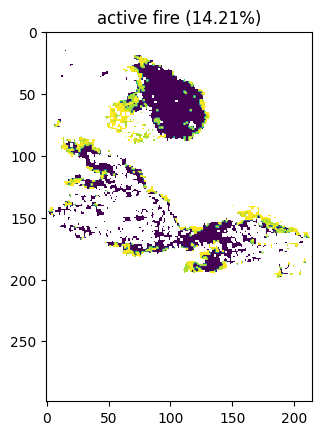

Max value = 2148.0
Min value = 1024.0


In [21]:
band = get_band(max_key_path,-1)
plt.imshow(band)
plt.title(band_names[-1]+f' ({pcdict[max_key]:.2f}%)')
ax.axis('off')
plt.show()
print('Max value =',np.nanmax(band))
print('Min value =',np.nanmin(band))

In [22]:
df[df['Fire_Event_ID']=='fire_24332939']

,Year,Fire_Event_ID,Duration (days)
16,2020,fire_24332939,52


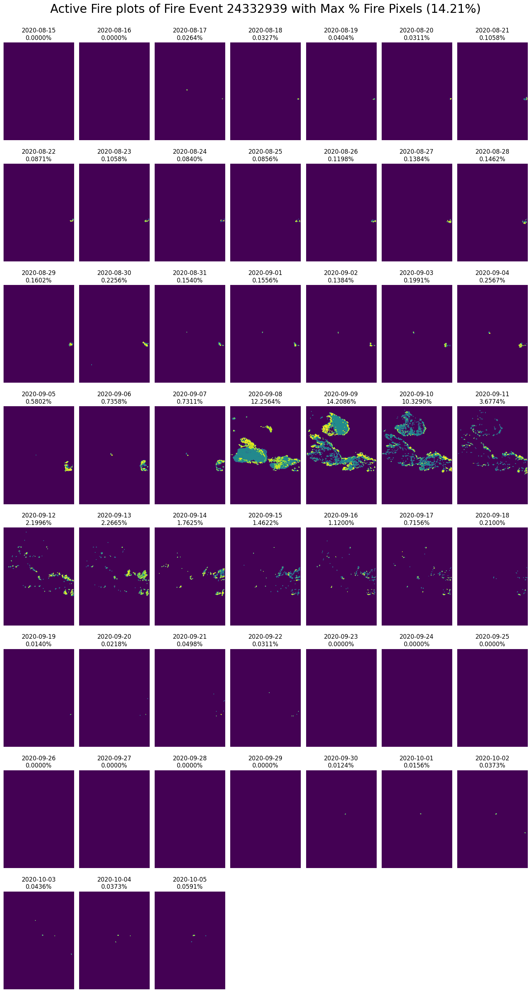

In [23]:
max_key_dir = '/'.join(max_key_path.split('/')[:-1])
tifs = sorted(os.listdir(max_key_dir))
rows, cols = 8, 7
fig, axes = plt.subplots(rows, cols, figsize=(15, 28))
axes = axes.flatten()
for i in range(rows * cols):
    ax = axes[i]
    if i < 52:
        band = np.nan_to_num(get_band(f"{max_key_dir}/{tifs[i]}",pos=-1))
        im = ax.imshow(band)
        pfire = pcdict[f"{max_key_dir.replace('/WildfireSpreadTS','')}/{tifs[i]}"]
        ax.set_title(f"{tifs[i][:-4]}\n{pfire:.4f}%",fontsize=12)
        ax.axis('off')
    else:
        ax.axis('off')
plt.suptitle("Active Fire plots of Fire Event 24332939 with Max % Fire Pixels (14.21%)",fontsize=24,y=1)
plt.tight_layout()
plt.show()

In [24]:
pcdf = pd.DataFrame({'Path':pcdict.keys(),'%Fire':pcdict.values()})
pcdf['Year'] = pcdf['Path'].apply(lambda x:x.split('/')[4])
pcdf['EvID'] = pcdf['Path'].apply(lambda x:x.split('/')[5])
pcdf['Filename'] = pcdf['Path'].apply(lambda x:x.split('/')[6])
pcdf

,Path,%Fire,Year,EvID,Filename
0,/kaggle/input/wildfirespreadts/2018/fire_21889...,0.037369,2018,fire_21889697,2018-07-16.tif
1,/kaggle/input/wildfirespreadts/2018/fire_21889...,0.811659,2018,fire_21889697,2018-09-28.tif
2,/kaggle/input/wildfirespreadts/2018/fire_21889...,0.496263,2018,fire_21889697,2018-08-29.tif
3,/kaggle/input/wildfirespreadts/2018/fire_21889...,0.212257,2018,fire_21889697,2018-08-24.tif
4,/kaggle/input/wildfirespreadts/2018/fire_21889...,0.551570,2018,fire_21889697,2018-07-21.tif
...,...,...,...,...,...
13602,/kaggle/input/wildfirespreadts/2020/fire_24333...,0.000000,2020,fire_24333267,2020-08-08.tif
13603,/kaggle/input/wildfirespreadts/2020/fire_24333...,0.000000,2020,fire_24333267,2020-08-03.tif
13604,/kaggle/input/wildfirespreadts/2020/fire_24333...,0.000000,2020,fire_24333267,2020-08-09.tif
13605,/kaggle/input/wildfirespreadts/2020/fire_24333...,0.000000,2020,fire_24333267,2020-08-10.tif


In [25]:
pcdf.groupby('Year')['%Fire'].mean().sort_values(ascending=False)

Year
2021    0.267608
2020    0.213396
2018    0.140303
2019    0.040350
Name: %Fire, dtype: float64

In [46]:
print(f"Total No. of Tif Files with 0% Fire = {len(pcdf[pcdf['%Fire']==0])} ({len(pcdf[pcdf['%Fire']==0])/pcdf.shape[0]*100:.2f}%)")

Total No. of Tif Files with 0% Fire = 5396 (39.66%)


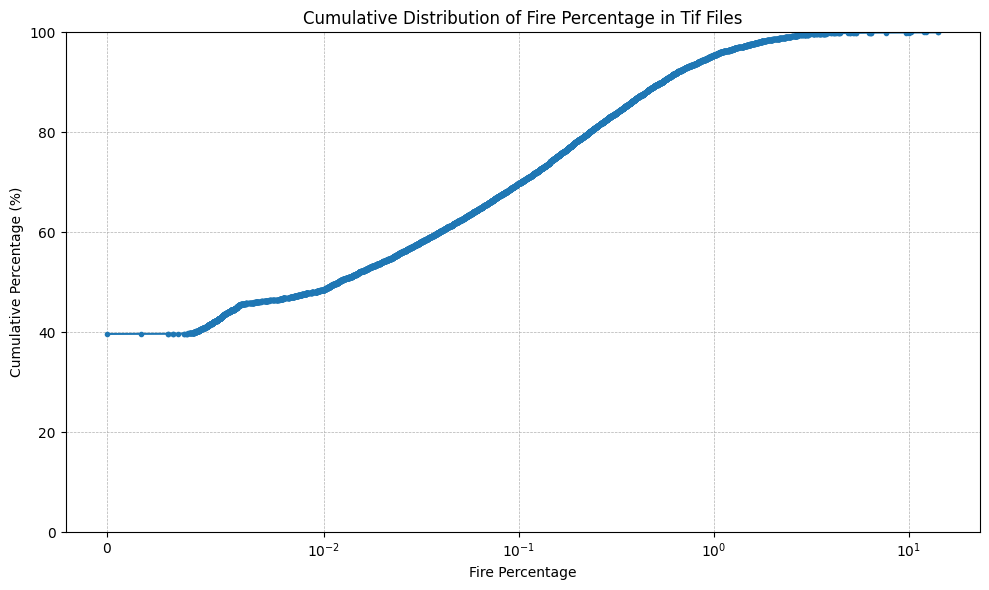

In [44]:
col = pcdf['%Fire'].dropna().values
total = len(col)
zeros = np.sum(col == 0)
non_zeros = col[col > 0]
sorted_non_zeros = np.sort(non_zeros)
x_vals = np.concatenate([[0], sorted_non_zeros])
y_vals = np.concatenate([[zeros / total * 100], (np.arange(1, len(non_zeros) + 1) + zeros) / total * 100])
plt.figure(figsize=(10, 6))
plt.plot(x_vals, y_vals, marker='.', linestyle='-')
plt.xscale('symlog', linthresh=1e-2)
plt.xlabel('Fire Percentage')
plt.ylabel('Cumulative Percentage (%)')
plt.title('Cumulative Distribution of Fire Percentage in Tif Files')
plt.ylim(0,100)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()

In [43]:
import plotly.graph_objects as go
col = pcdf['%Fire'].dropna().values
total = len(col)
zeros = np.sum(col == 0)
non_zeros = col[col > 0]
sorted_non_zeros = np.sort(non_zeros)
x_vals = np.concatenate([[0], sorted_non_zeros])
y_vals = np.concatenate([[zeros / total * 100], (np.arange(1, len(non_zeros) + 1) + zeros) / total * 100])
fig = go.Figure()
fig.add_trace(go.Scatter(
    x=x_vals,
    y=y_vals,
    mode='lines+markers',
    name='CDF',
    line=dict(shape='hv')
))
fig.update_layout(
    title='Cumulative Distribution of Fire Percentage in Tif Files',
    xaxis=dict(
        title='Fire Percentage',
        type='log',
        tickvals=[0.0, 0.01, 0.1, 1, 10],
        ticktext=['0', '0.01', '0.1', '1', '10'],
    ),
    yaxis=dict(
        title='Cumulative Percentage (%)',
        range=[0, 100],
    ),
    width=900,
    height=600
)
fig.show()

In [26]:
fedf = pcdf.groupby('EvID').agg(
    Avg_Fire=('%Fire', 'mean'),
    Zero_Fire_Count=('%Fire', lambda x: (x == 0).sum()),
    Total_Files=('Filename', 'count')
).reset_index()
fedf['% of Tif Files with 0% Fire'] = (fedf['Zero_Fire_Count'] / fedf['Total_Files']) * 100
fedf.sort_values(by='% of Tif Files with 0% Fire',ascending=False,ignore_index=True,inplace=True)
fedf

,EvID,Avg_Fire,Zero_Fire_Count,Total_Files,% of Tif Files with 0% Fire
0,fire_24604731,0.000181,21,22,95.454545
1,fire_25205312,0.000197,20,21,95.238095
2,fire_25205306,0.000195,20,21,95.238095
3,fire_24332728,0.001244,18,19,94.736842
4,fire_22863125,0.003303,18,19,94.736842
...,...,...,...,...,...
602,fire_24462819,0.523820,0,33,0.000000
603,fire_23410617,0.055602,0,19,0.000000
604,fire_24604435,0.747163,0,26,0.000000
605,fire_24604754,0.342208,0,16,0.000000


In [53]:
fedf.sort_values(by='Avg_Fire',ascending=False,ignore_index=True)

,EvID,Avg_Fire,Zero_Fire_Count,Total_Files,% of Tif Files with 0% Fire
0,fire_24332628,1.704170,9,76,11.842105
1,fire_25410483,1.501317,1,30,3.333333
2,fire_25294691,1.490014,5,63,7.936508
3,fire_25294692,1.421830,7,62,11.290323
4,fire_25294714,1.416796,8,72,11.111111
...,...,...,...,...,...
602,fire_22258421,0.000270,18,19,94.736842
603,fire_21615465,0.000243,14,15,93.333333
604,fire_25205312,0.000197,20,21,95.238095
605,fire_25205306,0.000195,20,21,95.238095


In [57]:
print(f"No. of Fire Events longer than 14 Days = {len(fedf[fedf['Total_Files']>14])} ({len(fedf[fedf['Total_Files']>14])/len(fedf)*100:.2f}%)")
ntf = fedf[fedf['Total_Files']>14]['Total_Files'].sum()
print(f"No. of Tif Files in these Fire Events = {ntf:,} ({ntf/len(pcdf)*100:.2f}%)")

No. of Fire Events longer than 14 Days = 500 (82.37%)
No. of Tif Files in these Fire Events = 12,231 (89.89%)


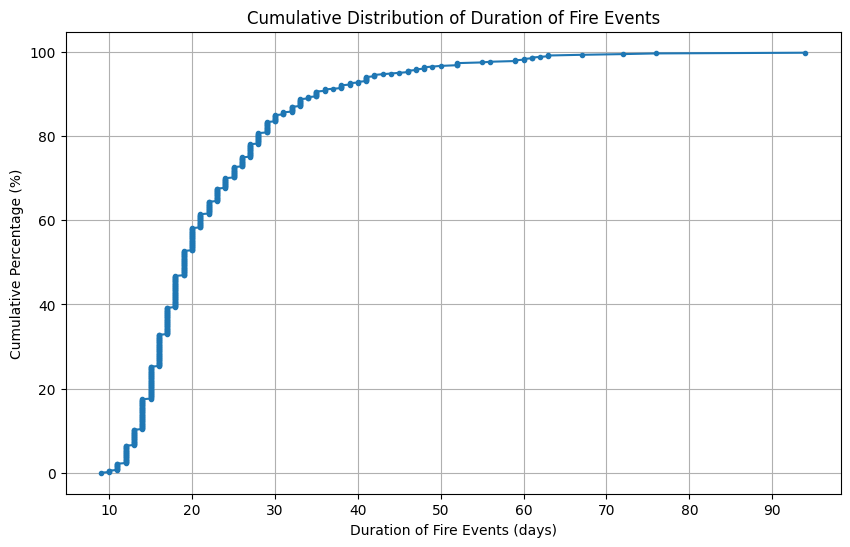

In [50]:
sorted_vals = np.sort(fedf['Total_Files'])
cdf = np.arange(len(sorted_vals)) / len(sorted_vals) * 100  # convert to percentage
plt.figure(figsize=(10, 6))
plt.plot(sorted_vals, cdf, marker='.', linestyle='-')
plt.xlabel('Duration of Fire Events (days)')
plt.ylabel('Cumulative Percentage (%)')
plt.title('Cumulative Distribution of Duration of Fire Events')
plt.xticks(range(10,100,10))
plt.grid(True)
plt.show()

In [54]:
df[df['Fire_Event_ID']=='fire_24604731']

,Year,Fire_Event_ID,Duration (days)
230,2020,fire_24604731,22


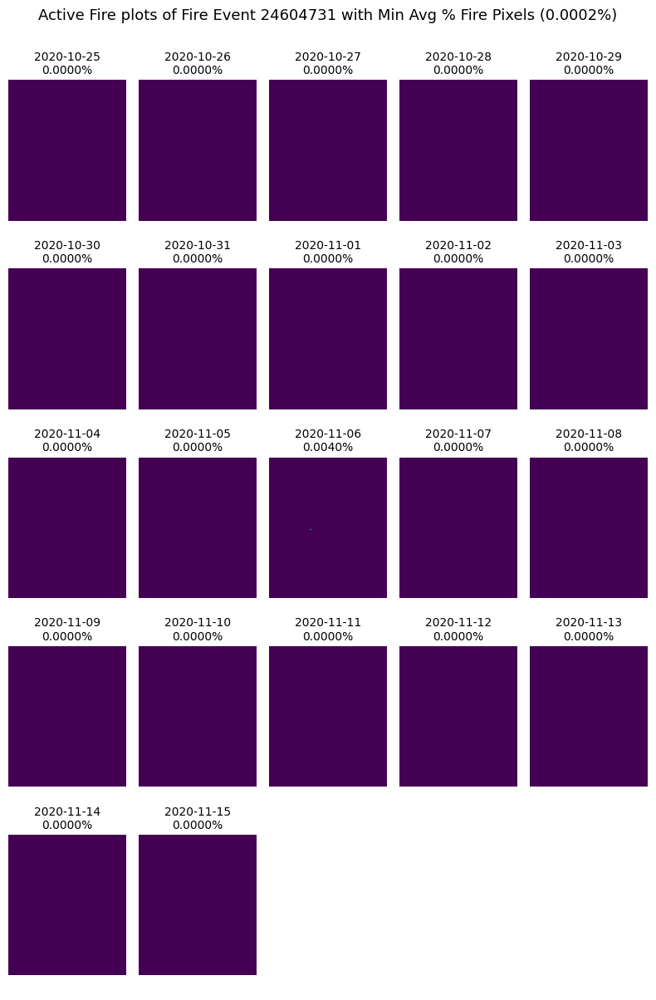

In [105]:
min_fire_dir = os.path.join(dpath,'2020/fire_24604731')
tifs = sorted(os.listdir(min_fire_dir))
rows, cols = 5, 5
fig, axes = plt.subplots(rows, cols, figsize=(8, 12))
axes = axes.flatten()
for i in range(rows * cols):
    ax = axes[i]
    if i < 22:
        band = np.nan_to_num(get_band(f"{min_fire_dir}/{tifs[i]}",pos=-1))
        im = ax.imshow(band)
        pfire = pcdict[f"{min_fire_dir.replace('/WildfireSpreadTS','')}/{tifs[i]}"]
        ax.set_title(f"{tifs[i][:-4]}\n{pfire:.4f}%",fontsize=10)
        ax.axis('off')
    else:
        ax.axis('off')
plt.suptitle("Active Fire plots of Fire Event 24604731 with Min Avg % Fire Pixels (0.0002%)",fontsize=13,y=1)
plt.tight_layout()
plt.show()

In [92]:
df[df['Fire_Event_ID']=='fire_24332628']

,Year,Fire_Event_ID,Duration (days)
1,2020,fire_24332628,76


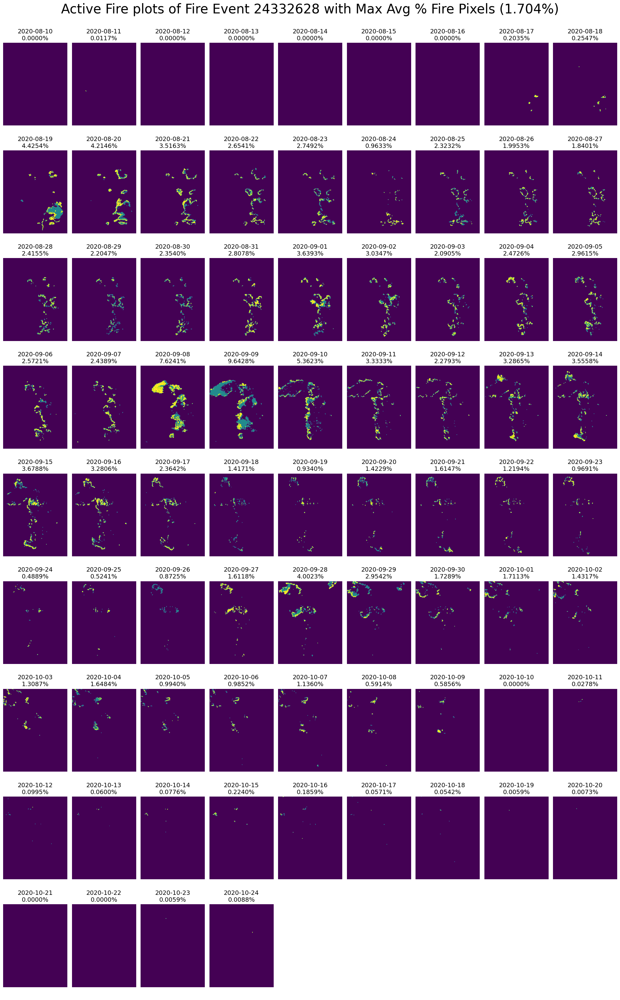

In [107]:
max_avgfire_dir = os.path.join(dpath,'2020/fire_24332628')
tifs = sorted(os.listdir(max_avgfire_dir))
rows, cols = 9, 9
fig, axes = plt.subplots(rows, cols, figsize=(20,32))
axes = axes.flatten()
for i in range(rows * cols):
    ax = axes[i]
    if i < 76:
        band = np.nan_to_num(get_band(f"{max_avgfire_dir}/{tifs[i]}",pos=-1))
        im = ax.imshow(band)
        pfire = pcdict[f"{max_avgfire_dir.replace('/WildfireSpreadTS','')}/{tifs[i]}"]
        ax.set_title(f"{tifs[i][:-4]}\n{pfire:.4f}%",fontsize=14)
        ax.axis('off')
    else:
        ax.axis('off')
plt.suptitle("Active Fire plots of Fire Event 24332628 with Max Avg % Fire Pixels (1.704%)",fontsize=30,y=1)
plt.tight_layout()
plt.show()

In [103]:
fedf[fedf['% of Tif Files with 0% Fire']==0].sort_values(by='Avg_Fire',ascending=False,ignore_index=True)

,EvID,Avg_Fire,Zero_Fire_Count,Total_Files,% of Tif Files with 0% Fire
0,fire_25410659,0.873161,0,21,0.0
1,fire_25548063,0.761789,0,27,0.0
2,fire_24604435,0.747163,0,26,0.0
3,fire_21999260,0.707783,0,33,0.0
4,fire_24461421,0.607854,0,15,0.0
5,fire_24462819,0.523820,0,33,0.0
6,fire_24332591,0.404932,0,35,0.0
7,fire_22343689,0.343774,0,11,0.0
8,fire_24604754,0.342208,0,16,0.0
9,fire_24461771,0.333282,0,33,0.0


In [104]:
df[df['Fire_Event_ID']=='fire_25410659']

,Year,Fire_Event_ID,Duration (days)
244,2021,fire_25410659,21


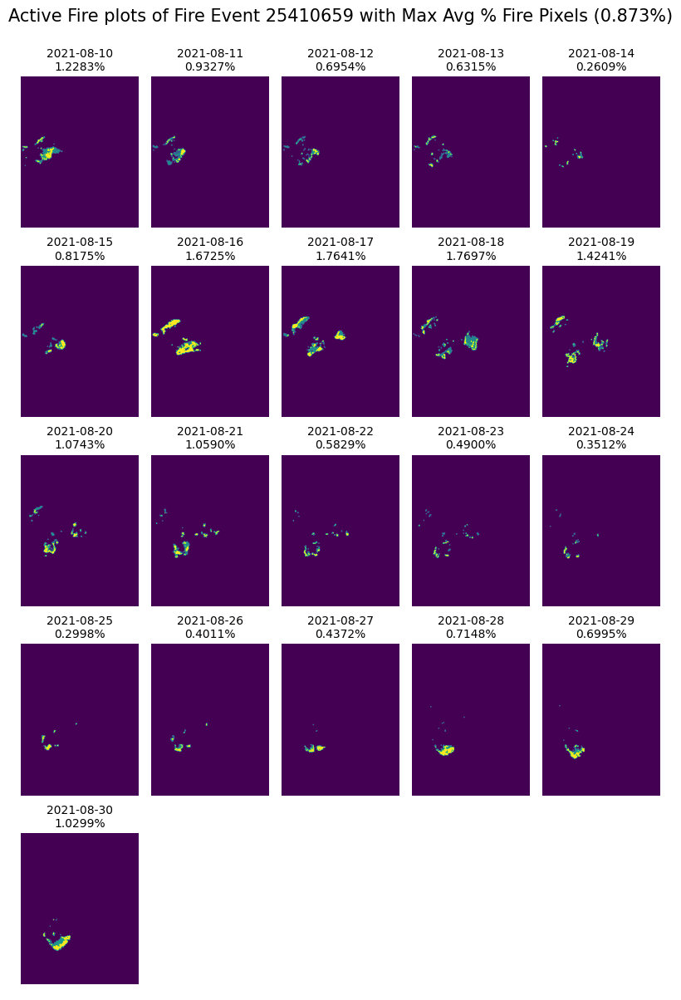

In [109]:
max_allfire_dir = os.path.join(dpath,'2021/fire_25410659')
tifs = sorted(os.listdir(max_allfire_dir))
rows, cols = 5, 5
fig, axes = plt.subplots(rows, cols, figsize=(8,12))
axes = axes.flatten()
for i in range(rows * cols):
    ax = axes[i]
    if i < 21:
        band = np.nan_to_num(get_band(f"{max_allfire_dir}/{tifs[i]}",pos=-1))
        im = ax.imshow(band)
        pfire = pcdict[f"{max_allfire_dir.replace('/WildfireSpreadTS','')}/{tifs[i]}"]
        ax.set_title(f"{tifs[i][:-4]}\n{pfire:.4f}%",fontsize=10)
        ax.axis('off')
    else:
        ax.axis('off')
plt.suptitle("Active Fire plots of Fire Event 25410659 with Max Avg % Fire Pixels (0.873%)",fontsize=15,y=1)
plt.tight_layout()
plt.show()

In [39]:
impfev = pcdf[pcdf['%Fire']>0.1]['EvID'].unique()
print("No. of Fire Events with atleast 1 Fire Event with minimum 0.1% fire =",len(impfev))

No. of Fire Events with atleast 1 Fire Event with minimum 0.1% fire = 483


In [82]:
seq_len = 14
seqs = []
cc = 0
for ev in pcdf['EvID'].unique():
    tifs = pcdf[pcdf['EvID']==ev].sort_values(by='Filename',ignore_index=True)
    if len(tifs)>seq_len:
        paths = list(tifs['Path'])
        fps = list(tifs['%Fire'])
        for i in range(len(tifs)-seq_len):
            if fps[i+seq_len] > 0:
                seqs.append(paths[i:i+seq_len])
            else:
                cc+=1
print(cc,"sequences avoided with 0% fire on next day")
print("Total sequences =",len(seqs))

1630 sequences avoided with 0% fire on next day
Total sequences = 3601


In [52]:
data_summary = []
for tif_file in tqdm(spdf['Path']):
    with rasterio.open(tif_file) as src:
        img = src.read() 
        feature_stats = {}
        feature_stats['Path'] = tif_file
        for i in range(22): 
            band = img[i]
            band = np.nan_to_num(band)
            feature_stats[f'band_{i+1}_mean'] = np.mean(band)
            feature_stats[f'band_{i+1}_std'] = np.std(band)
        fire_mask = (np.nan_to_num(img[22]) > 0).astype(np.float32)
        feature_stats['fire_mask_sum'] = np.sum(fire_mask)
        feature_stats['fire_mask_ratio'] = np.sum(fire_mask) / fire_mask.size
        data_summary.append(feature_stats)
feats = pd.DataFrame(data_summary)
feats

100%|██████████| 13607/13607 [32:12<00:00,  7.04it/s]  


,Path,band_1_mean,band_1_std,band_2_mean,band_2_std,band_3_mean,band_3_std,band_4_mean,band_4_std,band_5_mean,...,band_19_mean,band_19_std,band_20_mean,band_20_std,band_21_mean,band_21_std,band_22_mean,band_22_std,fire_mask_sum,fire_mask_ratio
0,/kaggle/input/wildfirespreadts/WildfireSpreadT...,574.836060,437.398956,2227.643555,574.054810,354.551025,516.762390,7525.800781,1746.829346,4066.603027,...,1.751890,0.634761,40.778667,55.687649,21.838364,1.671008,0.008245,0.000250,25.0,0.000374
1,/kaggle/input/wildfirespreadts/WildfireSpreadT...,1140.059814,861.811951,2645.589355,1107.945435,1465.464111,1304.847168,7335.584473,1813.362671,3098.895752,...,0.292520,0.146930,-20.026979,40.532074,14.336805,0.881377,0.006762,0.000157,543.0,0.008117
2,/kaggle/input/wildfirespreadts/WildfireSpreadT...,814.615601,983.485413,2643.683594,1047.210327,825.200928,1305.188110,7327.669922,1855.405151,3553.645996,...,1.111590,0.486808,29.267103,70.656387,16.754570,1.016683,0.007235,0.000322,332.0,0.004963
3,/kaggle/input/wildfirespreadts/WildfireSpreadT...,602.640320,351.355103,2492.896240,763.432434,371.149353,300.516846,7363.502930,1841.493042,3574.978271,...,1.702396,0.511169,46.274998,55.058868,16.193296,1.133877,0.007561,0.000225,142.0,0.002123
4,/kaggle/input/wildfirespreadts/WildfireSpreadT...,586.947388,359.868927,2322.259766,480.825714,396.387695,424.975952,7424.945312,1936.037109,3905.449707,...,0.973024,0.530127,-10.630246,75.132858,21.985149,1.375886,0.008518,0.000149,369.0,0.005516
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13602,/kaggle/input/wildfirespreadts/WildfireSpreadT...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3040.058105,713.279602,1636.364136,...,1.078432,0.236155,-37.571823,19.911449,24.161963,0.601155,0.005153,0.000090,0.0,0.000000
13603,/kaggle/input/wildfirespreadts/WildfireSpreadT...,2812.312988,866.614197,3328.180176,1604.505981,2508.919434,1815.699829,3045.407959,695.448364,1644.455078,...,1.366044,0.315848,2.844221,15.681138,24.815756,0.571815,0.008027,0.000084,0.0,0.000000
13604,/kaggle/input/wildfirespreadts/WildfireSpreadT...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3040.058105,713.279602,1636.364136,...,0.624401,0.201289,-36.955757,30.260727,23.836287,0.526597,0.005604,0.000119,0.0,0.000000
13605,/kaggle/input/wildfirespreadts/WildfireSpreadT...,2202.510986,399.745636,2376.193604,598.094727,1303.078369,376.497620,3040.058105,713.279602,1636.364136,...,0.956165,0.266176,-5.135515,20.684669,25.536779,0.578063,0.005871,0.000070,0.0,0.000000


In [149]:
feats.to_csv('/kaggle/working/BandStatistics.csv')

In [64]:
for i in range(1,23):
    n = len(feats[feats[f'band_{i}_mean']==0])
    print(f"{n} Tif Files with All 0s in band {i}")

540 Tif Files with All 0s in band 1
540 Tif Files with All 0s in band 2
540 Tif Files with All 0s in band 3
925 Tif Files with All 0s in band 4
925 Tif Files with All 0s in band 5
8020 Tif Files with All 0s in band 6
0 Tif Files with All 0s in band 7
0 Tif Files with All 0s in band 8
0 Tif Files with All 0s in band 9
0 Tif Files with All 0s in band 10
3 Tif Files with All 0s in band 11
0 Tif Files with All 0s in band 12
0 Tif Files with All 0s in band 13
0 Tif Files with All 0s in band 14
0 Tif Files with All 0s in band 15
10 Tif Files with All 0s in band 16
0 Tif Files with All 0s in band 17
4333 Tif Files with All 0s in band 18
0 Tif Files with All 0s in band 19
0 Tif Files with All 0s in band 20
0 Tif Files with All 0s in band 21
0 Tif Files with All 0s in band 22


In [173]:
nbwz = (feats.iloc[:,:-2] == 0).sum(axis=1).sort_values(ascending=False)
idxs = nbwz[nbwz>4].index
yrs,fes,paths = [],[],[]
for idx in idxs:
    path = feats.loc[idx]['Path']
    paths.append(path)
    yrs.append(path.split('/')[5])
    fes.append(path.split('/')[6])
print(pd.Series(yrs).value_counts())
print(pd.Series(fes).value_counts())

2021    893
2020    214
2018     77
2019     65
Name: count, dtype: int64
fire_25294999    28
fire_25410996    19
fire_25295081    19
fire_25295852    18
fire_25410858    18
                 ..
fire_21890019     1
fire_22343688     1
fire_21889992     1
fire_21889672     1
fire_23301095     1
Name: count, Length: 293, dtype: int64


In [190]:
feats2 = feats[[col for col in feats.columns if col not in ['band_6_mean','band_6_std','band_18_mean','band_18_std','fire_mask_sum','fire_mask_ratio']]]
nbwz = (feats2 == 0).sum(axis=1).sort_values(ascending=False)
idxs = nbwz[nbwz>0].index
yrs,fes,paths = [],[],[]
for idx in idxs:
    path = feats2.loc[idx]['Path']
    paths.append(path)
    yrs.append(path.split('/')[5])
    fes.append(path.split('/')[6])
print(pd.Series(yrs).value_counts())
print(pd.Series(fes).value_counts())

2021    931
2020    250
2018    121
2019     77
Name: count, dtype: int64
fire_25294999    29
fire_25410858    20
fire_25295852    19
fire_25410996    19
fire_25295081    19
                 ..
fire_22141528     1
fire_24103545     1
fire_21998265     1
fire_23410616     1
fire_24695758     1
Name: count, Length: 303, dtype: int64


In [191]:
feats2['EvID'] = feats2['Path'].str.split('/').str[6]
feats2['No. of 0 Bands'] = ((feats2 == 0).sum(axis=1))
feats2

<ipython-input-191-6792303f7da1>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  feats2['EvID'] = feats2['Path'].str.split('/').str[6]
<ipython-input-191-6792303f7da1>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  feats2['No. of 0 Bands'] = ((feats2 == 0).sum(axis=1))


,Path,band_1_mean,band_1_std,band_2_mean,band_2_std,band_3_mean,band_3_std,band_4_mean,band_4_std,band_5_mean,...,band_19_mean,band_19_std,band_20_mean,band_20_std,band_21_mean,band_21_std,band_22_mean,band_22_std,EvID,No. of 0 Bands
0,/kaggle/input/wildfirespreadts/WildfireSpreadT...,574.836060,437.398956,2227.643555,574.054810,354.551025,516.762390,7525.800781,1746.829346,4066.603027,...,1.751890,0.634761,40.778667,55.687649,21.838364,1.671008,0.008245,0.000250,fire_21889697,0
1,/kaggle/input/wildfirespreadts/WildfireSpreadT...,1140.059814,861.811951,2645.589355,1107.945435,1465.464111,1304.847168,7335.584473,1813.362671,3098.895752,...,0.292520,0.146930,-20.026979,40.532074,14.336805,0.881377,0.006762,0.000157,fire_21889697,0
2,/kaggle/input/wildfirespreadts/WildfireSpreadT...,814.615601,983.485413,2643.683594,1047.210327,825.200928,1305.188110,7327.669922,1855.405151,3553.645996,...,1.111590,0.486808,29.267103,70.656387,16.754570,1.016683,0.007235,0.000322,fire_21889697,0
3,/kaggle/input/wildfirespreadts/WildfireSpreadT...,602.640320,351.355103,2492.896240,763.432434,371.149353,300.516846,7363.502930,1841.493042,3574.978271,...,1.702396,0.511169,46.274998,55.058868,16.193296,1.133877,0.007561,0.000225,fire_21889697,0
4,/kaggle/input/wildfirespreadts/WildfireSpreadT...,586.947388,359.868927,2322.259766,480.825714,396.387695,424.975952,7424.945312,1936.037109,3905.449707,...,0.973024,0.530127,-10.630246,75.132858,21.985149,1.375886,0.008518,0.000149,fire_21889697,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13602,/kaggle/input/wildfirespreadts/WildfireSpreadT...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3040.058105,713.279602,1636.364136,...,1.078432,0.236155,-37.571823,19.911449,24.161963,0.601155,0.005153,0.000090,fire_24333267,6
13603,/kaggle/input/wildfirespreadts/WildfireSpreadT...,2812.312988,866.614197,3328.180176,1604.505981,2508.919434,1815.699829,3045.407959,695.448364,1644.455078,...,1.366044,0.315848,2.844221,15.681138,24.815756,0.571815,0.008027,0.000084,fire_24333267,0
13604,/kaggle/input/wildfirespreadts/WildfireSpreadT...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3040.058105,713.279602,1636.364136,...,0.624401,0.201289,-36.955757,30.260727,23.836287,0.526597,0.005604,0.000119,fire_24333267,6
13605,/kaggle/input/wildfirespreadts/WildfireSpreadT...,2202.510986,399.745636,2376.193604,598.094727,1303.078369,376.497620,3040.058105,713.279602,1636.364136,...,0.956165,0.266176,-5.135515,20.684669,25.536779,0.578063,0.005871,0.000070,fire_24333267,0


In [192]:
nzb = dict(feats2.groupby('EvID')['No. of 0 Bands'].sum().sort_values(ascending=False)/2)
for i, (k, v) in enumerate(nzb.items()):
    if i == 10:
        break
    print(k, v)

fire_25294999 75.0
fire_25410858 53.0
fire_25410996 50.0
fire_25295081 50.0
fire_25411029 47.0
fire_25295852 47.0
fire_25017384 42.0
fire_25294692 34.0
fire_25410445 34.0
fire_25410444 34.0


In [197]:
cc = 0
fewzb = pd.Series(fes).value_counts()
for evid,c in zip(fewzb.index,fewzb.values):
    dur = df[df['Fire_Event_ID']==evid]['Duration (days)'].values[0]
    perc_0bands = c / dur * 100
    if perc_0bands>=0:
        cc+=1
        print(f"{cc}. {evid} - {c} out of {dur} ({perc_0bands:.3f}%) tif files have total of {nzb[evid]:.0f} zero bands, on avg {nzb[evid]/c:.2f} zero bands per tif file")

1. fire_25294999 - 29 out of 60 (48.333%) tif files have total of 75 zero bands, on avg 2.59 zero bands per tif file
2. fire_25410858 - 20 out of 55 (36.364%) tif files have total of 53 zero bands, on avg 2.65 zero bands per tif file
3. fire_25295852 - 19 out of 59 (32.203%) tif files have total of 47 zero bands, on avg 2.47 zero bands per tif file
4. fire_25410996 - 19 out of 31 (61.290%) tif files have total of 50 zero bands, on avg 2.63 zero bands per tif file
5. fire_25295081 - 19 out of 35 (54.286%) tif files have total of 50 zero bands, on avg 2.63 zero bands per tif file
6. fire_25411029 - 18 out of 27 (66.667%) tif files have total of 47 zero bands, on avg 2.61 zero bands per tif file
7. fire_25294691 - 14 out of 63 (22.222%) tif files have total of 34 zero bands, on avg 2.43 zero bands per tif file
8. fire_25410444 - 14 out of 35 (40.000%) tif files have total of 34 zero bands, on avg 2.43 zero bands per tif file
9. fire_25017384 - 14 out of 28 (50.000%) tif files have total o

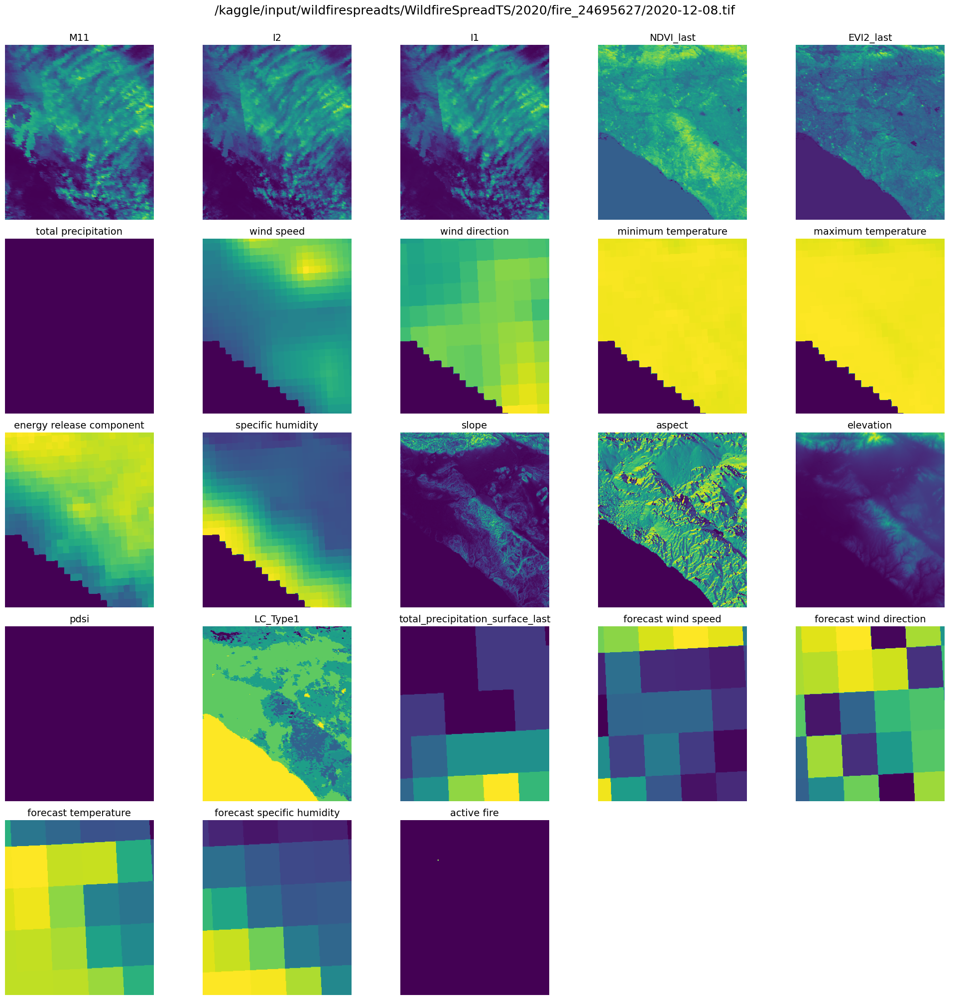

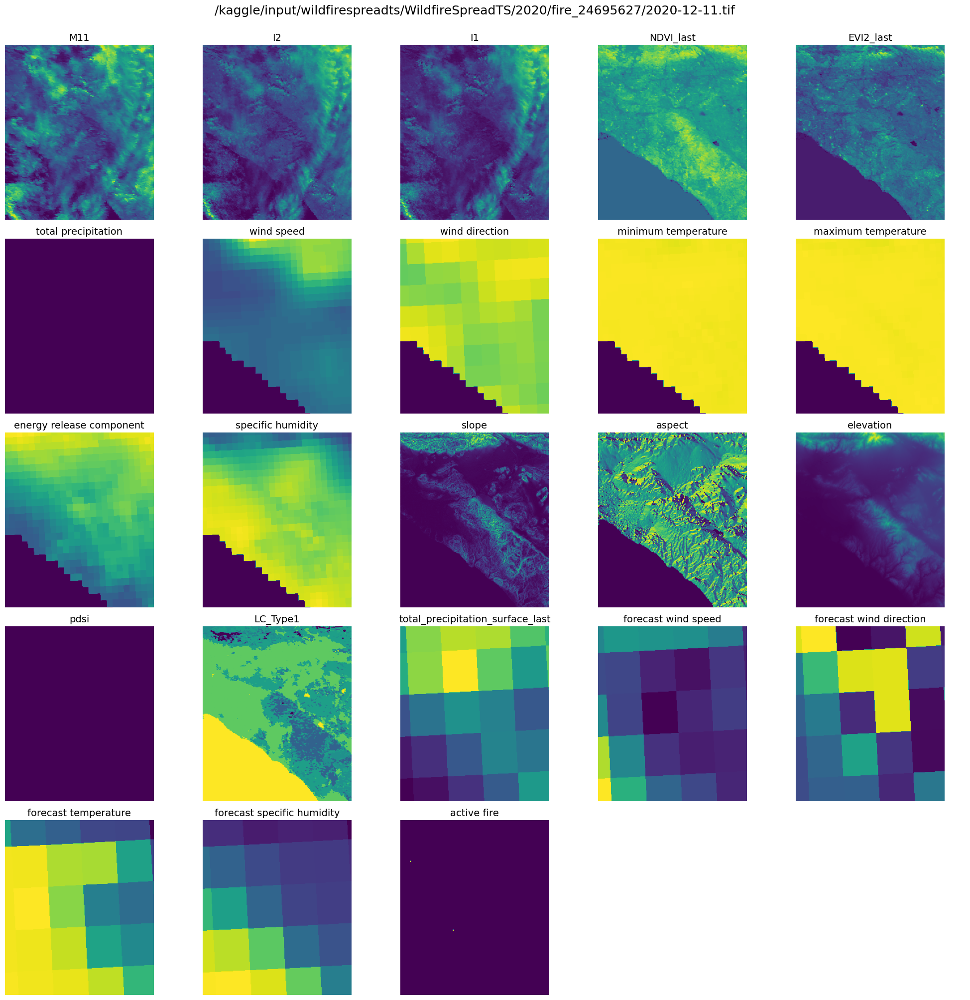

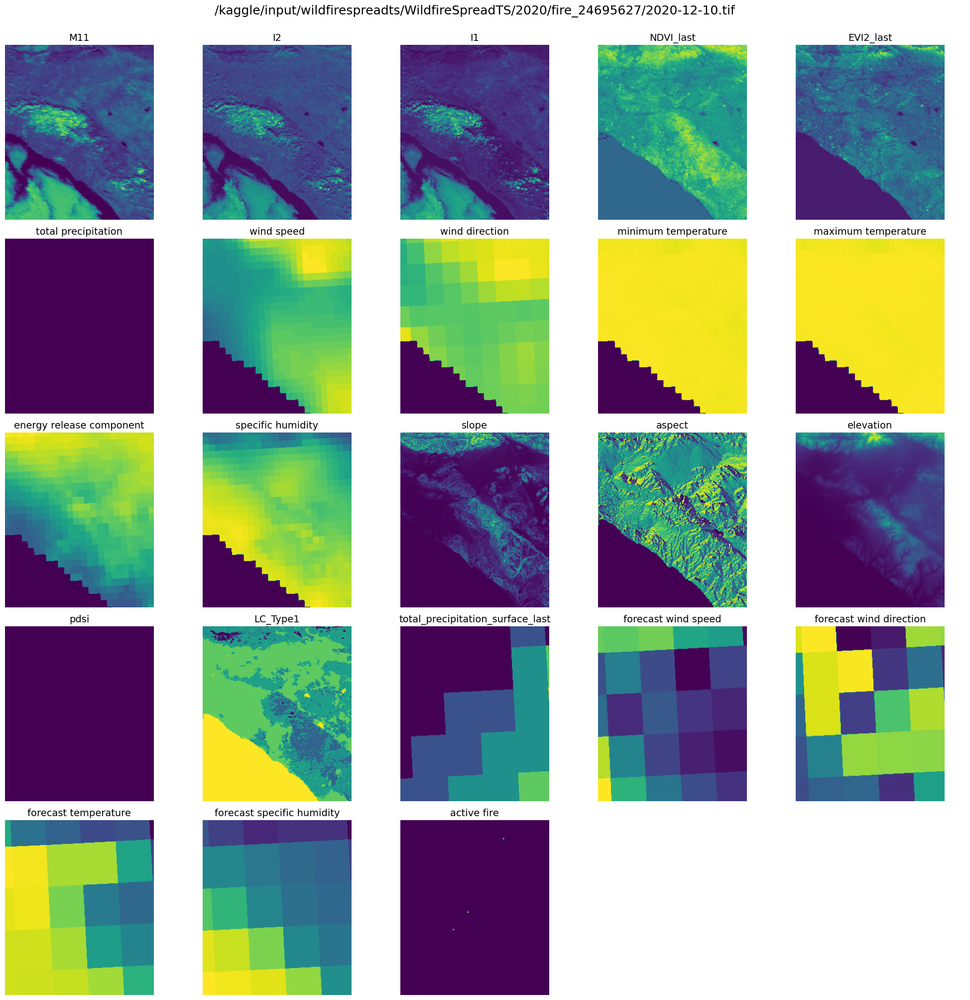

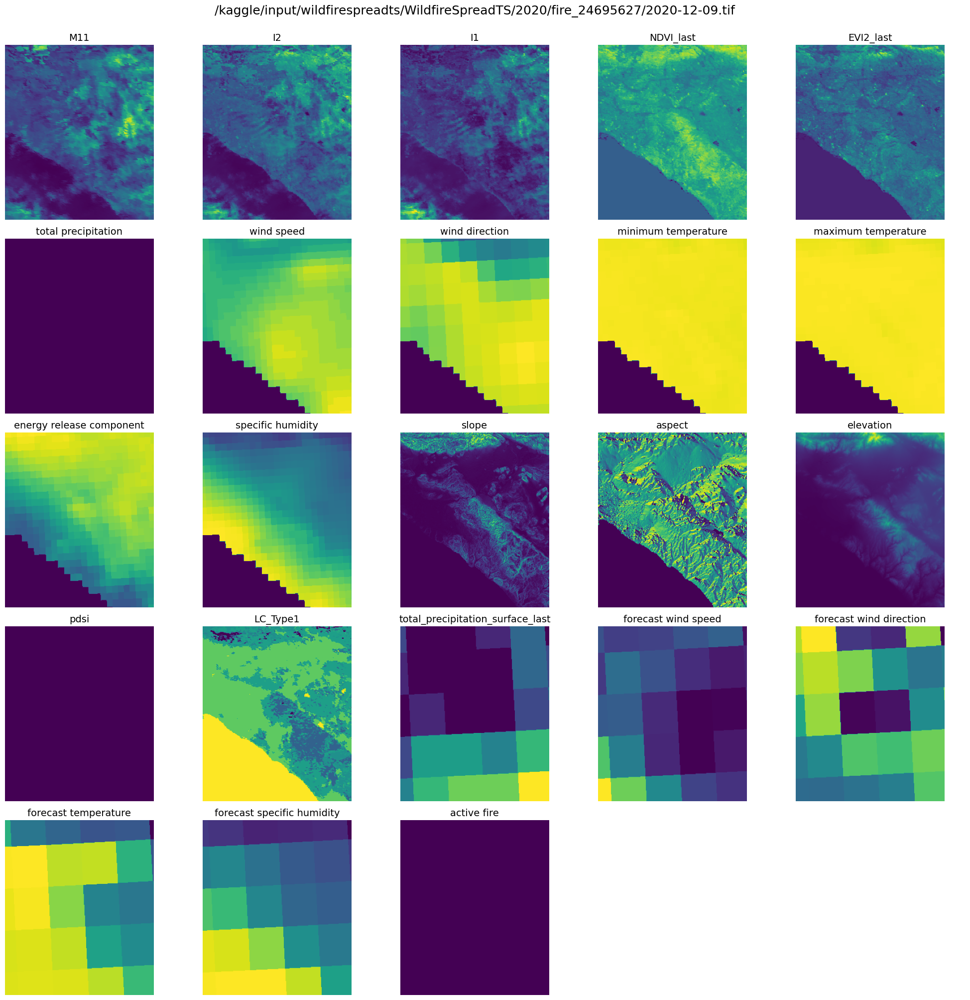

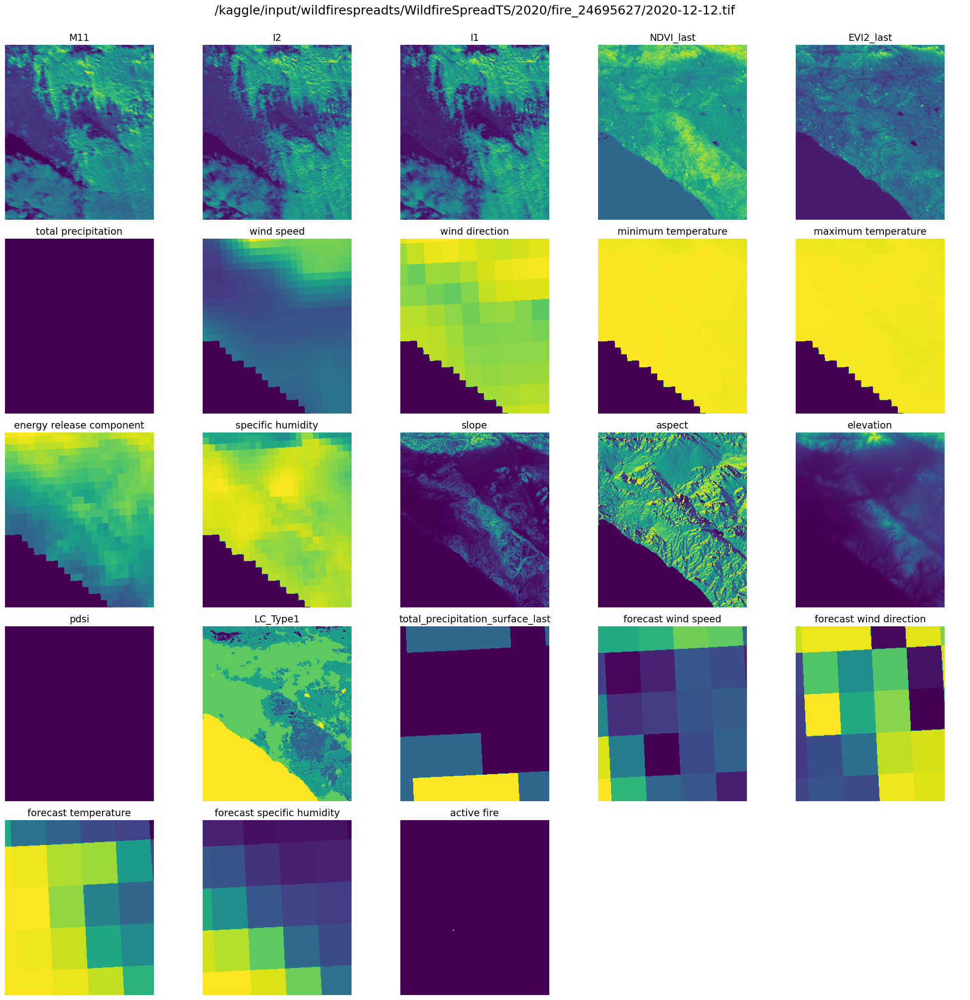

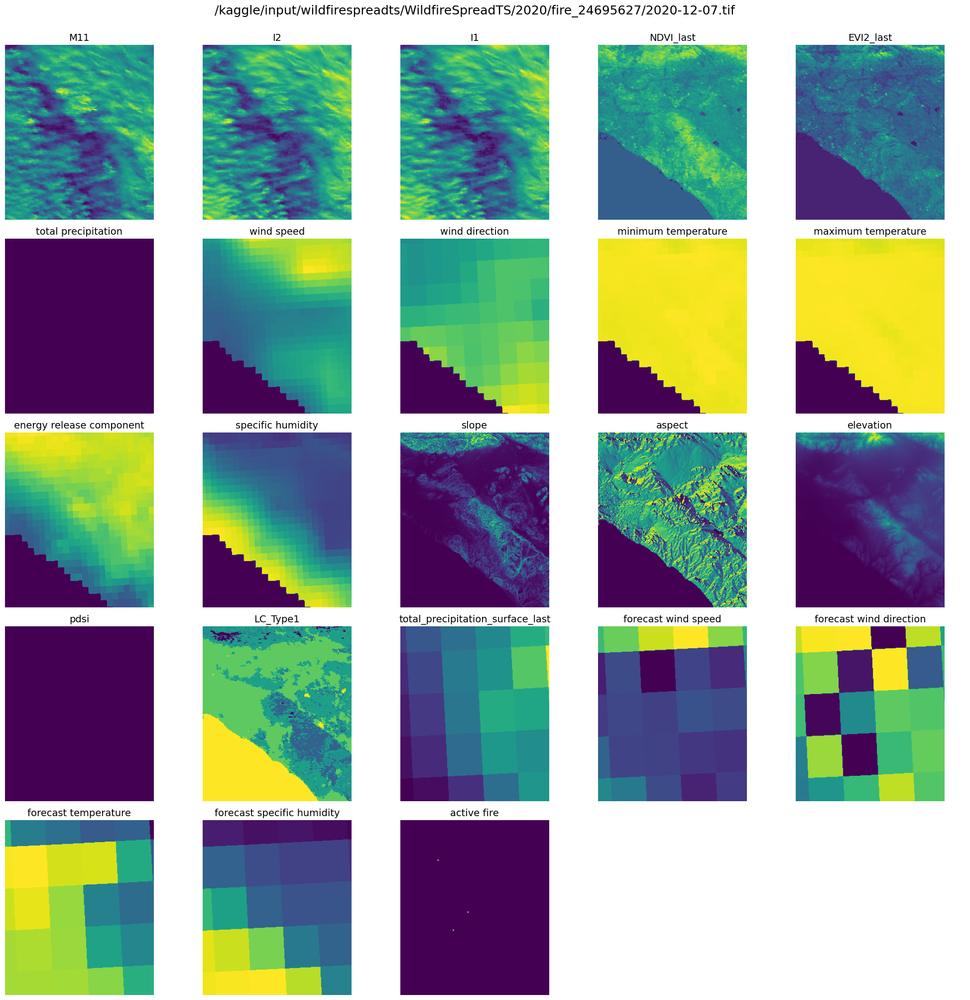

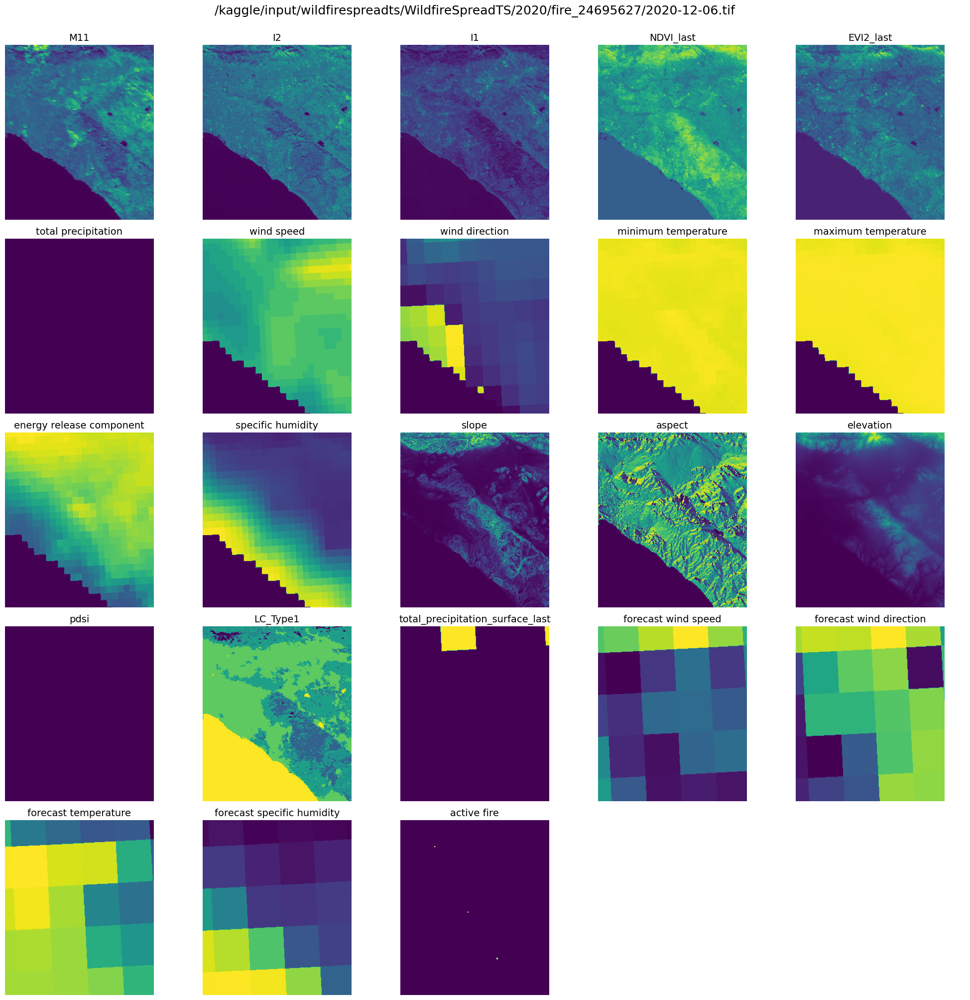

In [233]:
def plot_tiff(spath):
    with rasterio.open(spath) as tif:
        all_bands = tif.read()
        band_names = tif.descriptions
    rows, cols = 5, 5
    fig, axes = plt.subplots(rows, cols, figsize=(20, 20))
    axes = axes.flatten()
    num_bands = all_bands.shape[0]
    for i in range(rows * cols):
        ax = axes[i]
        if i < num_bands:
            band = np.nan_to_num(all_bands[i])
            im = ax.imshow(band)
            ax.set_title(band_names[i],fontsize=14)
            ax.axis('off')
        else:
            ax.axis('off')
    plt.suptitle(spath,fontsize=18,y=1.001)
    plt.tight_layout()
    plt.show()

#tifs = list(feats[feats['Path'].str.contains('fire_25294714', na=False)]['Path'])
tifs = [p for p in paths if 'fire_24695627' in p]
for tif in tifs:
    plot_tiff(tif)

In [163]:
df[df['Fire_Event_ID']=='fire_25294999']

,Year,Fire_Event_ID,Duration (days)
9,2021,fire_25294999,60


In [58]:
feats.sort_values(by='fire_mask_ratio',ascending=False)

,Path,band_1_mean,band_1_std,band_2_mean,band_2_std,band_3_mean,band_3_std,band_4_mean,band_4_std,band_5_mean,...,band_19_mean,band_19_std,band_20_mean,band_20_std,band_21_mean,band_21_std,band_22_mean,band_22_std,fire_mask_sum,fire_mask_ratio
1043,/kaggle/input/wildfirespreadts/WildfireSpreadT...,974.888611,1083.802246,3002.268311,1426.169922,1856.866821,1935.317505,7877.739746,1501.207764,4097.779785,...,0.559174,0.380102,-10.053032,42.195530,16.763710,1.164864,0.004918,0.000402,9134.0,0.142086
2988,/kaggle/input/wildfirespreadts/WildfireSpreadT...,1102.254761,1065.526855,3145.321289,1441.620361,2068.134033,1938.058105,7613.901855,1699.853394,4112.414551,...,0.500864,0.313297,-21.999592,46.133804,17.504585,1.696225,0.005223,0.000375,9032.0,0.141819
1067,/kaggle/input/wildfirespreadts/WildfireSpreadT...,943.176025,1183.018799,2698.771729,1296.625488,1194.629028,1655.999878,7877.739746,1501.207764,4097.779785,...,1.150656,0.388128,3.012589,19.741016,17.488256,1.530852,0.004249,0.000297,7879.0,0.122564
3003,/kaggle/input/wildfirespreadts/WildfireSpreadT...,1098.380493,1186.191284,2887.688721,1363.366943,1429.416260,1728.964478,7613.901855,1699.853394,4112.414551,...,1.188908,0.348951,4.527992,21.899561,18.369717,1.905505,0.004480,0.000308,7634.0,0.119867
1046,/kaggle/input/wildfirespreadts/WildfireSpreadT...,1324.317017,784.637207,4038.710449,1053.906982,3504.489990,1535.904175,7877.739746,1501.207764,4097.779785,...,0.593661,0.631013,10.027278,22.905771,16.031717,0.754131,0.005965,0.000478,6640.0,0.103290
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7174,/kaggle/input/wildfirespreadts/WildfireSpreadT...,2418.316650,787.794678,3021.593994,1009.696655,1516.359131,1071.719727,3645.515137,1045.876099,2072.800049,...,1.949856,0.540960,47.799133,16.743675,18.896967,1.739867,0.005545,0.000362,0.0,0.000000
2611,/kaggle/input/wildfirespreadts/WildfireSpreadT...,1192.477905,834.544434,2980.633057,1936.990112,2267.543701,1995.891846,2949.555908,1768.785278,1413.562988,...,3.080545,1.129819,28.450228,17.422306,-7.118207,2.188249,0.002265,0.000151,0.0,0.000000
7175,/kaggle/input/wildfirespreadts/WildfireSpreadT...,1946.748413,549.276978,2646.435791,840.040649,1236.391113,741.725586,3337.358154,1027.590088,1982.754761,...,1.662252,0.632974,-41.075970,40.931053,17.614763,1.587962,0.007218,0.000314,0.0,0.000000
7176,/kaggle/input/wildfirespreadts/WildfireSpreadT...,2387.176270,672.029236,2716.184082,683.088623,1416.160889,717.929199,3193.963379,1015.008362,1904.571533,...,1.987316,0.683706,42.116856,19.963844,21.313604,1.737600,0.007387,0.000402,0.0,0.000000


         Feature  Importance
20  band_11_mean    0.122222
32  band_17_mean    0.092808
12   band_7_mean    0.072435
22  band_12_mean    0.056617
17    band_9_std    0.056441
4    band_3_mean    0.047804
5     band_3_std    0.045437
8    band_5_mean    0.031172
1     band_1_std    0.023531
7     band_4_std    0.022985


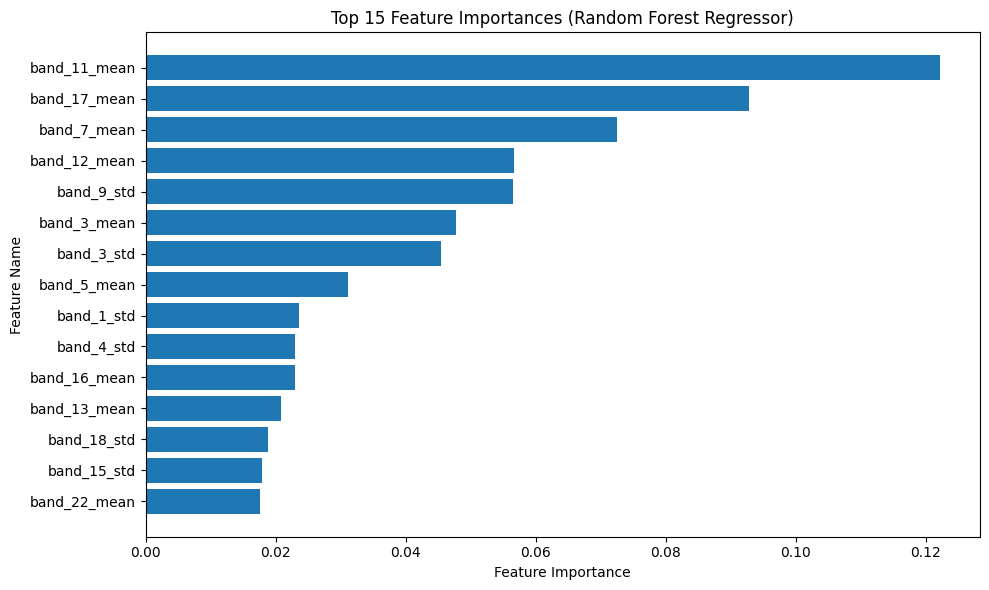

In [238]:
from sklearn.ensemble import RandomForestRegressor
X = feats.iloc[:,1:45]
y = feats.iloc[:,-1]
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X, y)
importances = model.feature_importances_
feature_names = X.columns
impdf = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)
print(impdf.head(10))

plt.figure(figsize=(10, 6))
plt.barh(impdf['Feature'][:15][::-1], impdf['Importance'][:15][::-1])
plt.xlabel('Feature Importance')
plt.ylabel('Feature Name')
plt.title('Top 15 Feature Importances (Random Forest Regressor)')
plt.tight_layout()
plt.show()

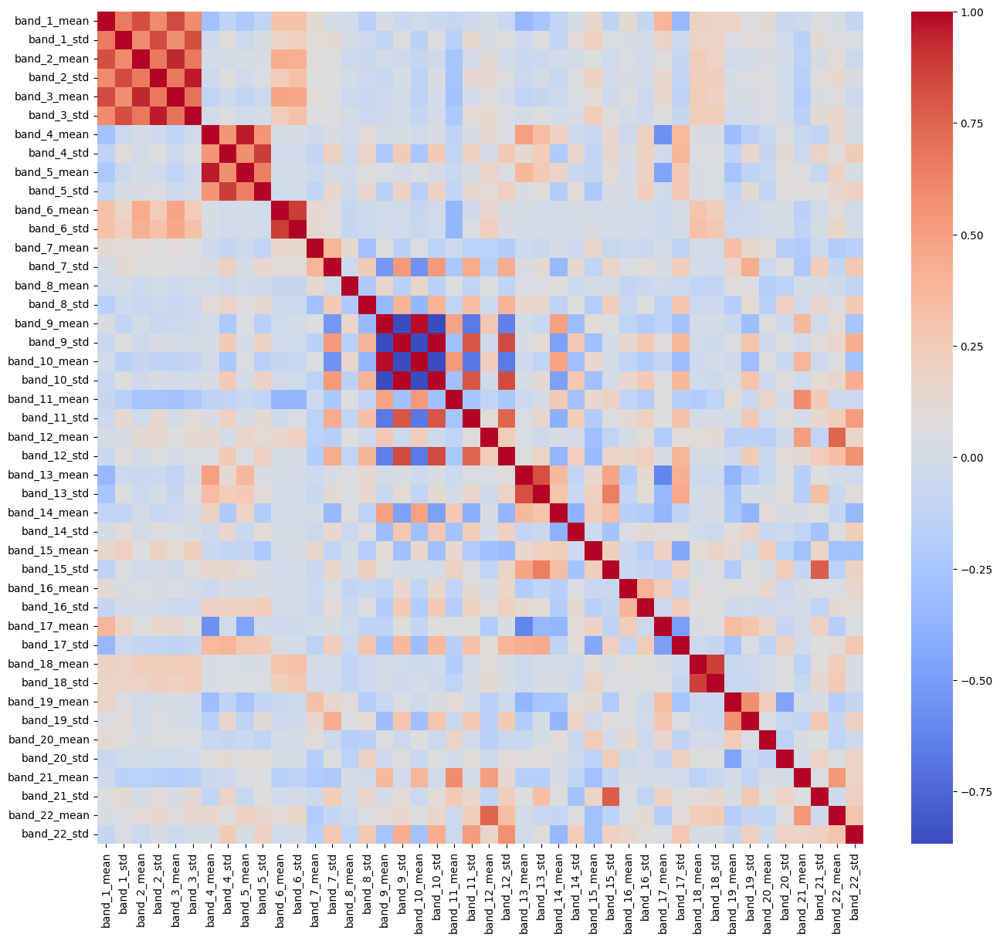

In [243]:
plt.figure(figsize=(16,14))
sns.heatmap(X.corr(),cmap='coolwarm')
plt.show()